In [1]:
#scan.ipynb
#by Joe Hahn, jmh.datasciences@gmail.com, 2 August 2020.
#inspect the output of all simulations launched by scan.py

In [2]:
#get paths to all simulations
import os
parent_path = 'permutations/'
paths = os.listdir(parent_path)
paths.remove('.gitignore')
paths.remove('nothing')
paths = [parent_path + path for path in paths]
print 'number of paths = ', len(paths)
paths[0:5]

number of paths =  1155


['permutations/sim_id=57!total_ring_mass=2.000000000000003e-10!shear_viscosity=2.805172958708047e-11!timesteps_per_output=38!radial_width=0.0008!bulk_viscosity=2.805172958708047e-11!',
 'permutations/sim_id=463!total_ring_mass=1.2619146889603877e-09!shear_viscosity=9.953129248655795e-12!timesteps_per_output=380!radial_width=0.0012!bulk_viscosity=9.953129248655795e-12!',
 'permutations/sim_id=247!total_ring_mass=5.023772863019166e-10!shear_viscosity=7.046275893016342e-12!timesteps_per_output=213!radial_width=0.0008!bulk_viscosity=7.046275893016342e-12!',
 'permutations/sim_id=332!total_ring_mass=7.96214341106994e-10!shear_viscosity=1.7699444808340774e-12!timesteps_per_output=1349!radial_width=0.0008!bulk_viscosity=1.7699444808340774e-12!',
 'permutations/sim_id=300!total_ring_mass=5.023772863019166e-10!shear_viscosity=3.1474558271792703e-10!timesteps_per_output=4!radial_width=0.0003!bulk_viscosity=3.1474558271792703e-10!']

In [3]:
#prep plots
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.max_open_warning': 0})
color_seq = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [4]:
#order paths by sim_id
data = []
for p in paths:
    str_id = int(p.split('sim_id=')[1].split('!total_ring_mass=')[0])
    d = {'sim_id':str_id, 'path':p}
    data += [d]
paths_df = pd.DataFrame(data)[['sim_id', 'path']].sort_values('sim_id').reset_index(drop=True)
paths_df.head()

,sim_id,path
0,0,permutations/sim_id=0!total_ring_mass=2.000000...
1,1,permutations/sim_id=1!total_ring_mass=2.000000...
2,2,permutations/sim_id=2!total_ring_mass=2.000000...
3,3,permutations/sim_id=3!total_ring_mass=2.000000...
4,4,permutations/sim_id=4!total_ring_mass=2.000000...


In [5]:
#set power laws for ringlet's dynamical timescale = time for e_prime to reach 0.6, which is assumed to vary as 
#(ringlet_mass**mass_power_law)*(viscosity**viscosity_power_law)*(radial_width**width_power_law)
nominal_dynamical_timescale = 1.65e4
mass_power_law = 1.0
viscosity_power_law = -1.0
width_power_law = 0.0

In [6]:
#get outcome of every sim
debug = False
from helper_fns import *
from libration import *
data = []
xlim = (-0.2, 10.2)
for idx, row in paths_df.iterrows():
    
    #read simulation input and revised output
    execfile('inputs.py')
    path = row.path
    r, t, vr, vt, times, lambda0, monitor = restore_output(path)
    d = {}
    modified_params = monitor['modified_params']
    for key, val in modified_params.iteritems():
        exec(key + '=val')
        d[key] = val
    current_timestep = monitor['current_timestep']
    streamline_crossing_timestep = monitor['streamline_crossing_timestep']
    expected_timestep = timesteps_per_output*total_number_of_outputs
    d['current_timestep'] = current_timestep
    d['streamline_crossing_timestep'] = streamline_crossing_timestep
    d['expected_timestep'] = expected_timestep
    d['path'] = path
    
    #compute time in units of ringlet's dynamical timescale
    dynamical_timescale = nominal_dynamical_timescale
    dynamical_timescale *= (total_ring_mass/2.0e-09)**mass_power_law
    dynamical_timescale *= (shear_viscosity/1.0e-11)**viscosity_power_law
    dynamical_timescale *= (radial_width/0.0005)**width_power_law
    times_dynamical = times/dynamical_timescale
    d['dynamical_timescale'] = dynamical_timescale
    d['times_dynamical_max'] = times_dynamical.max()
    
    #calculate differences da, de, dwt between outer & inner streamline's periapse
    a, e, wt, M = coords2elem(J2, Rp, r, t, vr, vt)
    a_inner, a_outer, a_mean, da, e_inner, e_outer, e_mean, de, wt_inner, wt_outer, dwt = \
        orbit_deltas(times, r, a, e, wt)
    da_init = da[0]
    
    #compute e_prime, wt_prime, q to lowest order, and H(q)
    H, q, e_prime, wt_prime = calculate_Hq(a_mean, e_mean, da, de, dwt)
    jdx = (times_dynamical > 0.8*times_dynamical.max())
    d['q'] = q[jdx].mean()
    d['delta_q'] = 0.5*(q[jdx].max() - q[jdx].min())
    d['wt_prime'] = wt_prime[jdx].mean()
    dq_dt = (q - np.roll(q, 1))/(times_dynamical - np.roll(times_dynamical, 1))
    d['dq_dt'] = dq_dt[jdx].mean()
    
    #outcome=self-confining provided sim completes and |wt_prime| isnt too large
    if (current_timestep == expected_timestep):
        d['outcome'] = 'self-confining'
        if (np.abs(d['wt_prime']) > d['q']/2):
            d['outcome'] = 'unconfined'
    if (streamline_crossing_timestep > 0):
        d['outcome'] = 'crossed streamlines'      
    if (current_timestep < expected_timestep):
        d['outcome'] = 'crossed streamlines'
    if (np.isnan(d['q'])):
        d['outcome'] = 'crossed streamlines'
    data += [d]
df = pd.DataFrame(data)
cols = ['sim_id', 'expected_timestep', 'current_timestep', 'streamline_crossing_timestep', 'dynamical_timescale', 
    'times_dynamical_max', 'total_ring_mass', 'radial_width', 'shear_viscosity', 'q', 'delta_q', 'dq_dt',
    'wt_prime', 'outcome', 'path']
df = df[cols].sort_values('sim_id').reset_index(drop=True)
#manual corrections to the above
ids = [592, 700, 701, 702, 703, 704, 707, 708, 812, 816, 817, 818, 819, 928, 929, 932]
df.loc[ids, 'outcome'] = 'self-confining'
df_results = df
df_results.sample(5)

helper_fns.py:29: RuntimeWarning: invalid value encountered in greater
  idx = angle > np.pi
helper_fns.py:31: RuntimeWarning: invalid value encountered in less
  idx = angle < -np.pi
libration.py:56: RuntimeWarning: invalid value encountered in greater
  idx = (dwt > np.pi)
libration.py:58: RuntimeWarning: invalid value encountered in less
  idx = (dwt < -np.pi)
libration.py:68: RuntimeWarning: invalid value encountered in sqrt
  q_factor = np.sqrt(1 - q2)


,sim_id,expected_timestep,current_timestep,streamline_crossing_timestep,dynamical_timescale,times_dynamical_max,total_ring_mass,radial_width,shear_viscosity,q,delta_q,dq_dt,wt_prime,outcome,path
772,772,2138000,320700,292264.0,58819.902526,2.726118,5.023773e-09,0.0008,7.046276e-12,NaN,NaN,NaN,NaN,crossed streamlines,permutations/sim_id=772!total_ring_mass=5.0237...
926,926,107000,90950,87617.0,2947.978423,15.425825,7.962143e-09,0.0005,2.228228e-10,NaN,NaN,NaN,NaN,crossed streamlines,permutations/sim_id=926!total_ring_mass=7.9621...
558,558,1202000,480800,473187.0,33076.861934,7.267920,2.000000e-09,0.0012,4.988381e-12,0.881869,0.034246,0.042994,-0.066076,crossed streamlines,permutations/sim_id=558!total_ring_mass=2.0000...
770,770,2138000,320700,258632.0,58819.902526,2.726118,5.023773e-09,0.0003,7.046276e-12,NaN,NaN,NaN,NaN,crossed streamlines,permutations/sim_id=770!total_ring_mass=5.0237...
724,724,30000,30000,NaN,830.853207,18.053731,3.169786e-09,0.0016,3.147456e-10,0.920889,0.015432,-0.004662,-0.897742,unconfined,permutations/sim_id=724!total_ring_mass=3.1697...


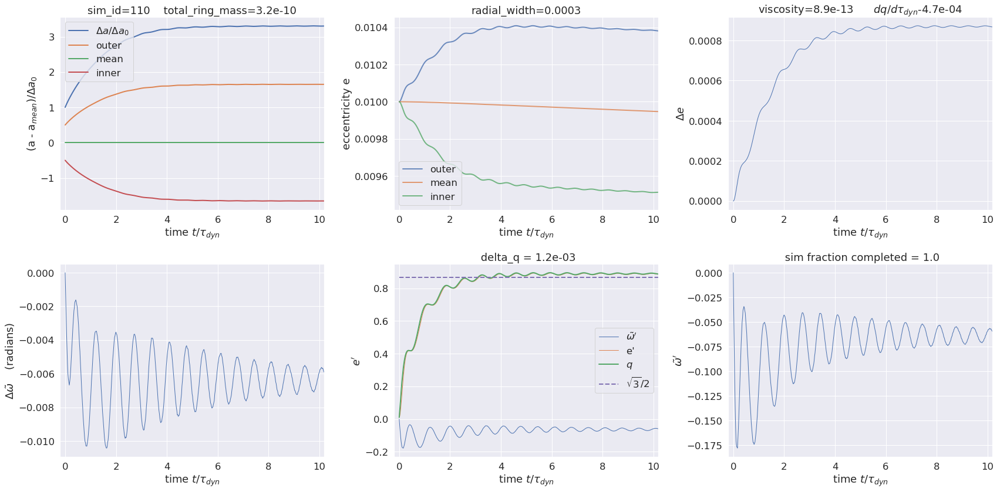

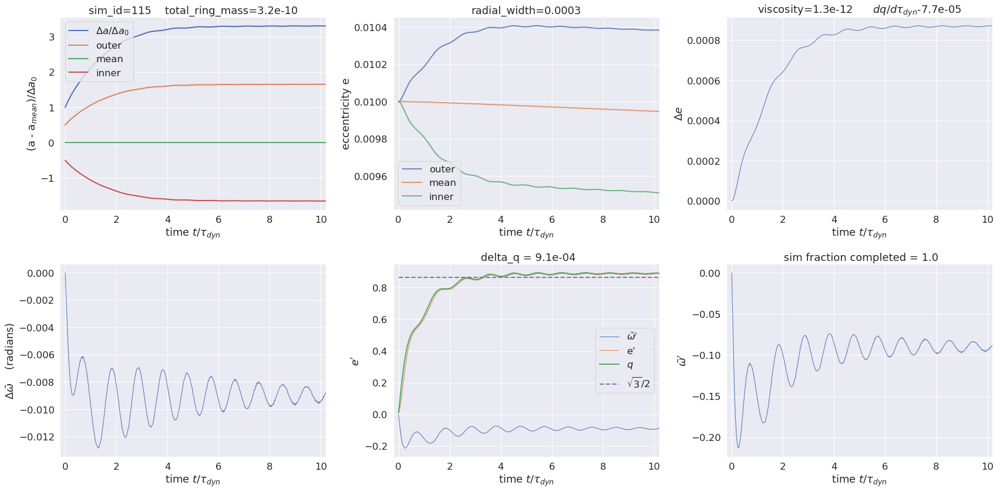

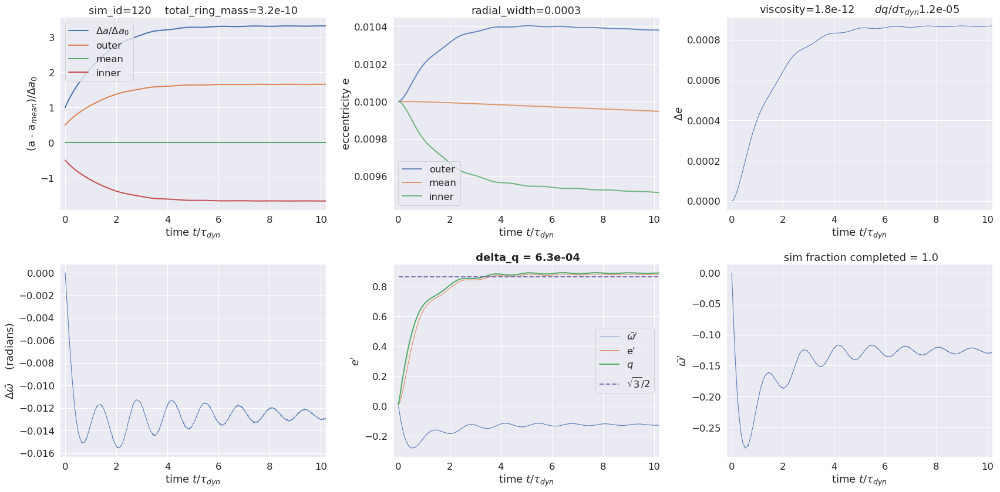

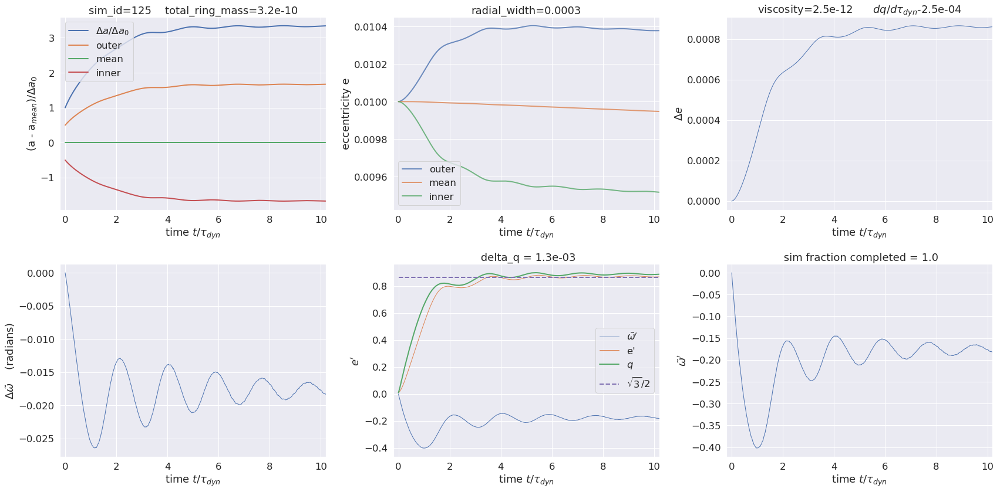

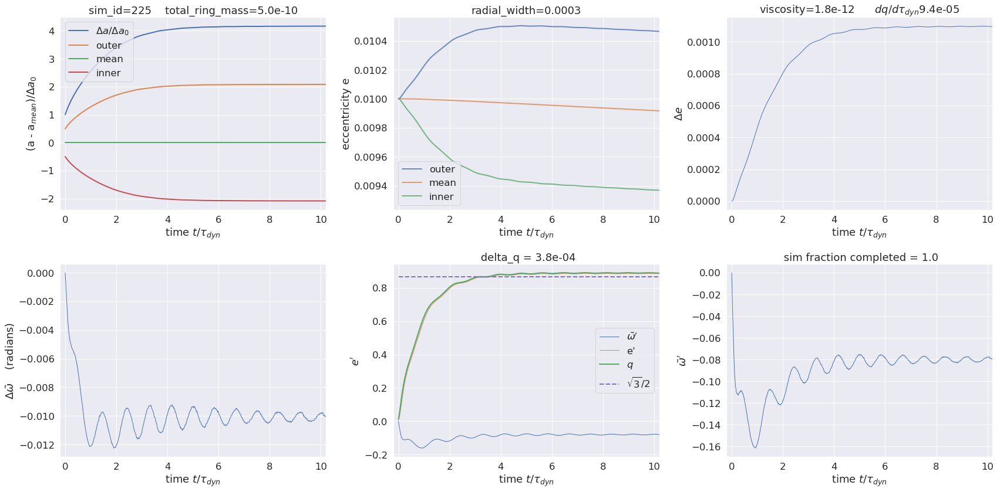

...

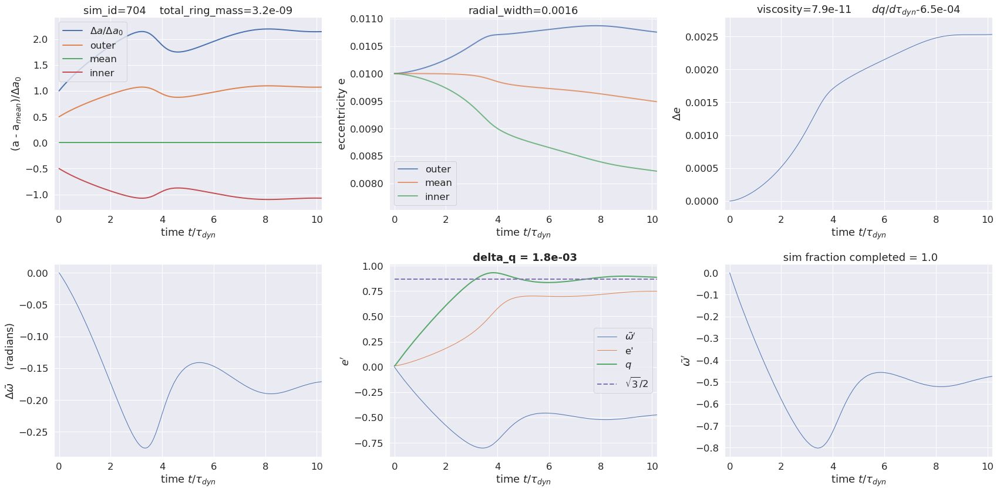

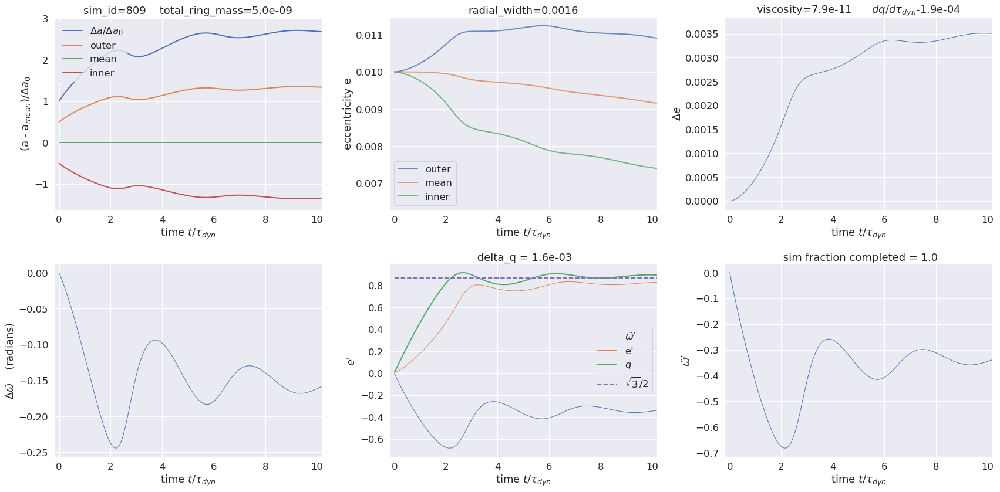

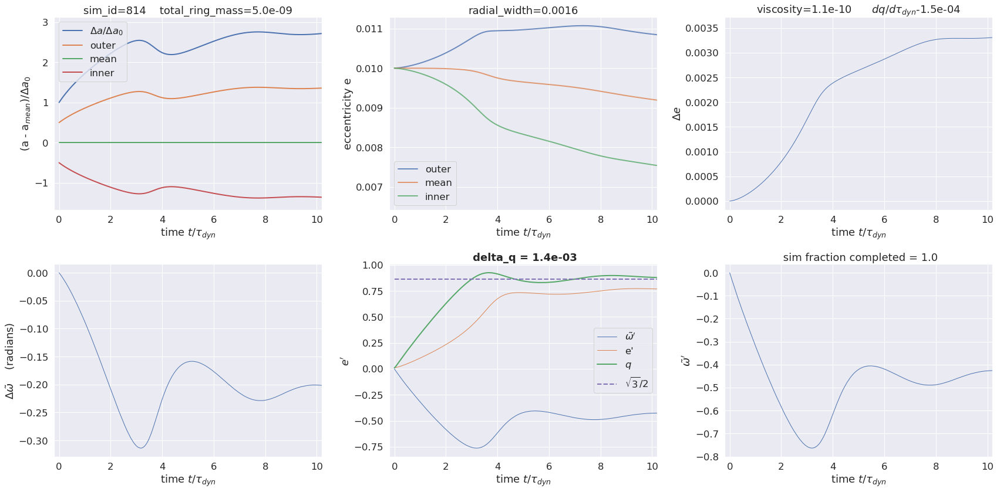

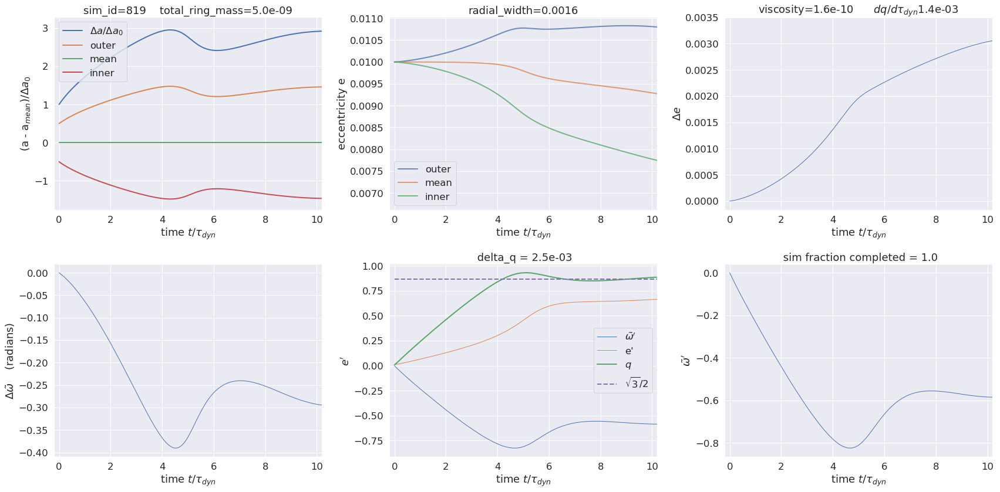

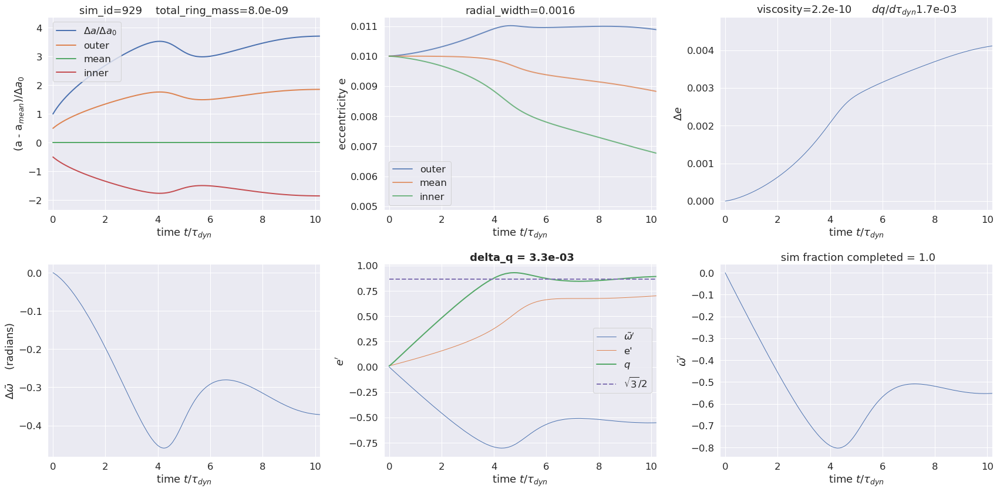

In [7]:
#generate summary plots for each sim that self-confines
df = df_results
xlim = (-0.2, 10.2)
radial_widths = df.radial_width.unique()
for radial_width in radial_widths:
    idx = (df.radial_width == radial_width) & (df.outcome == 'self-confining')
    dfs = df[idx].sort_values(['total_ring_mass', 'shear_viscosity'])
    for idx, row in dfs.iterrows():
        #read simulation input and revised output
        execfile('inputs.py')
        path = row.path
        r, t, vr, vt, times, lambda0, monitor = restore_output(path)
        dynamical_timescale = row.dynamical_timescale
        times_dynamical = times/dynamical_timescale
        #calculate differences da, de, dwt between outer & inner streamline's periapse
        a, e, wt, M = coords2elem(J2, Rp, r, t, vr, vt)
        a_inner, a_outer, a_mean, da, e_inner, e_outer, e_mean, de, wt_inner, wt_outer, dwt = \
            orbit_deltas(times, r, a, e, wt)
        da_init = da[0]
        H, q, e_prime, wt_prime = calculate_Hq(a_mean, e_mean, da, de, dwt)
        #create grid of plots
        sns.set(font_scale=1.5, font='DejaVu Sans')
        fig, axs = plt.subplots(2, 3, figsize=(24, 12))
        #plot streamline's mutual a-evolution
        ax = axs[0][0]
        x = times_dynamical
        y = da/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, label=r'$\Delta a/\Delta a_0$')
        y = (a_outer - a_mean)/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, label='outer')
        y = (a_mean - a_mean)/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, label='mean')
        y = (a_inner - a_mean)/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=1, label='inner')
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel('(a - a$_{mean})/\Delta a_0$')
        sim_id = row.sim_id
        total_ring_mass = row.total_ring_mass
        title = 'sim_id=' + str(sim_id) + '    total_ring_mass=' + '{:.1e}'.format(total_ring_mass)
        p = ax.set_title(title)
        p = ax.set_xlim(xlim)
        p = ax.legend()
        p = plt.tight_layout()
        #plot streamline's e-evolution
        ax = axs[0][1]
        x = times_dynamical
        y = e_outer
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=0.8, label='outer')
        y = e_mean
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=0.8, label='mean')
        y = e_inner
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=0.8, label='inner')
        p = ax.set_ylabel('eccentricity e')
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        radial_width = row.radial_width
        title = 'radial_width=' + str(radial_width)
        p = ax.set_title(title)
        p = ax.set_xlim(xlim)
        p = ax.legend()
        p = plt.tight_layout()
        #plot delta_e versus time
        ax = axs[0][2]
        x = times_dynamical
        y = de
        p = ax.plot(x, y, linestyle='-', linewidth=1)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel(r'$\Delta e$')
        shear_viscosity = row.shear_viscosity
        title = 'viscosity=' + '{:.1e}'.format(shear_viscosity)
        dq_dt = row.dq_dt
        title += r'      $dq/d\tau_{dyn}$' + '{:.1e}'.format(dq_dt)
        p = ax.set_title(title)
        p = ax.set_xlim(xlim)
        p = plt.tight_layout()
        #plot dwt versus time
        ax = axs[1][0]
        x = times_dynamical
        y = dwt
        p = ax.plot(x, y, linestyle='-', linewidth=1)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel(r'$\Delta\tilde{\omega}$    (radians)')
        p = ax.set_xlim(xlim)
        p = plt.tight_layout()
        #plot e_prime wt_prime and q versus time
        ax = axs[1][1]
        x = times_dynamical
        y = wt_prime
        p = ax.plot(x, y, linestyle='-', linewidth=1, label=r"$\tilde{\omega}'$")
        y = e_prime
        p = ax.plot(x, y, linestyle='-', linewidth=1, label="e'")
        y = q
        p = ax.plot(x, y, linestyle='-', linewidth=2, label=r'$q$')
        p = ax.plot(x[-1], y[-1], marker='o', markersize=10, label='')
        p = ax.plot(x, x*0 + np.sqrt(3.0)/2.0, linestyle='dashed', linewidth=2, label=r"$\sqrt{3}/2$")
        delta_q = row.delta_q
        title = ' delta_q = ' + '{:.1e}'.format(delta_q)
        fontweight = 'normal'
        idx = (dfs.total_ring_mass == total_ring_mass)
        if (dfs[idx].delta_q.min() == delta_q):
            fontweight = 'bold'
        p = ax.set_title(title, fontweight=fontweight)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel(r"$e'$")
        p = ax.set_xlim(xlim)
        p = ax.legend()
        p = plt.tight_layout()
        #plot wt_prime versus time
        ax = axs[1][2]
        x = times_dynamical
        y = wt_prime
        p = ax.plot(x, y, linestyle='-', linewidth=1)
        current_timestep = row.current_timestep
        expected_timestep = row.expected_timestep
        title = ' sim fraction completed = ' + str(current_timestep*1.0/expected_timestep)
        p = ax.set_title(title)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel(r"$\tilde{\omega}'$")
        p = ax.set_xlim(xlim)
        p = plt.tight_layout()

In [8]:
#list all sims that evolved into self-confining state
df = df_results
idx = (df.outcome == 'crossed streamlines')
print 'fraction of sims having crossed streamlines = ', idx.sum()*1.0/len(idx)
idx = (df.outcome == 'self-confining') | (df.outcome == 'unconfined')
print 'fraction of sims that execute to completion = ', idx.sum()*1.0/len(idx)
idx = (df.outcome == 'self-confining')
print 'fraction of sims that evolve to self-confining state = ', idx.sum()*1.0/len(idx)
idx = (df.outcome == 'unconfined')
print 'fraction of sims that dont self-confining = ', idx.sum()*1.0/len(idx)

fraction of sims having crossed streamlines =  0.7255411255411255
fraction of sims that execute to completion =  0.27445887445887446
fraction of sims that evolve to self-confining state =  0.07186147186147186
fraction of sims that dont self-confining =  0.2025974025974026


In [9]:
df_results.head()

,sim_id,expected_timestep,current_timestep,streamline_crossing_timestep,dynamical_timescale,times_dynamical_max,total_ring_mass,radial_width,shear_viscosity,q,delta_q,dq_dt,wt_prime,outcome,path
0,0,955000,47750,6814.0,26273.88535,0.908697,2.000000e-10,0.0003,6.280000e-13,0.549729,0.030801,0.335884,-0.108514,crossed streamlines,permutations/sim_id=0!total_ring_mass=2.000000...
1,1,955000,47750,10095.0,26273.88535,0.908697,2.000000e-10,0.0005,6.280000e-13,0.358264,0.063010,0.449095,-0.088778,crossed streamlines,permutations/sim_id=1!total_ring_mass=2.000000...
2,2,1698000,84900,11887.0,26273.88535,1.615673,2.000000e-10,0.0008,6.280000e-13,NaN,NaN,NaN,NaN,crossed streamlines,permutations/sim_id=2!total_ring_mass=2.000000...
3,3,3821000,191050,12784.0,26273.88535,3.635739,2.000000e-10,0.0012,6.280000e-13,NaN,NaN,NaN,NaN,crossed streamlines,permutations/sim_id=3!total_ring_mass=2.000000...
4,4,6794000,339700,13074.0,26273.88535,6.464594,2.000000e-10,0.0016,6.280000e-13,NaN,NaN,NaN,NaN,crossed streamlines,permutations/sim_id=4!total_ring_mass=2.000000...


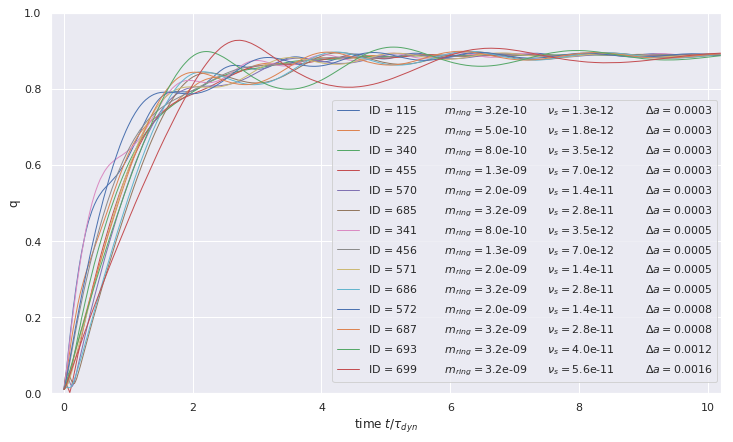

In [10]:
#for selected sim_ids showing low librations, plot q(t/t_dyn)
df = df_results
sim_ids = []
sim_ids += [115, 225, 340, 455, 570, 685,]
sim_ids += [341, 456, 571, 686,]
sim_ids += [572, 687,]
sim_ids += [693,]
sim_ids += [699,]
xlim = (-0.2, 10.2)
ylim = (0.0, 1.0)
qts = []
sns.set(font_scale=1.0, font='DejaVu Sans')
f, ax = plt.subplots(figsize=(12, 7))
for sim_id in sim_ids:
    idx = (df.sim_id == sim_id)
    dfs = df[idx]
    try:
        path = dfs.path.values[0]
        delta_q = dfs.delta_q.values[0]
        #read simulation input and revised output
        execfile('inputs.py')
        r, t, vr, vt, times, lambda0, monitor = restore_output(path)
        modified_params = monitor['modified_params']
        for key, val in modified_params.iteritems():
            exec(key + '=val')
            d[key] = val
        #compute time in units of ringlet's dynamical timescale
        dynamical_timescale = nominal_dynamical_timescale
        dynamical_timescale *= (total_ring_mass/2.0e-09)**mass_power_law
        dynamical_timescale *= (shear_viscosity/1.0e-11)**viscosity_power_law
        dynamical_timescale *= (radial_width/0.0005)**width_power_law
        times_dynamical = times/dynamical_timescale
        #calculate differences da, de, dwt between outer & inner streamline's periapse
        a, e, wt, M = coords2elem(J2, Rp, r, t, vr, vt)
        a_inner, a_outer, a_mean, da, e_inner, e_outer, e_mean, de, wt_inner, wt_outer, dwt = \
            orbit_deltas(times, r, a, e, wt)
        H, q, e_prime, wt_prime = calculate_Hq(a_mean, e_mean, da, de, dwt)
        #plot e_prime wt_prime and q versus time
        xp = times_dynamical
        yp = q
        sim_id_str = str(sim_id)
        if (len(sim_id_str) < 3): sim_id_str = '  ' + sim_id_str + '  '
        label = 'ID = ' + sim_id_str
        label += '\t' + r'$m_{ring}=$' + '{:.1e}'.format(total_ring_mass)
        label += '\t' + r'$\nu_s=$' + '{:.1e}'.format(shear_viscosity)
        label += '\t\t' + r'$\Delta a =$' + str(radial_width)
        p = ax.plot(xp, yp, linestyle='-', linewidth=1, label=label)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel('q')
        p = ax.set_xlim(xlim)
        p = ax.set_ylim(ylim)
        p = ax.legend(loc=(0.42, 0.03))
        d = {'times':times, 'q':q, 'total_ring_mass':total_ring_mass, 'shear_viscosity':shear_viscosity, 
            'radial_width':radial_width}
        qts += [d]
    except:
        pass
file = 'figs/q_vs_ID.pdf'
plt.savefig(file, bbox_inches='tight')

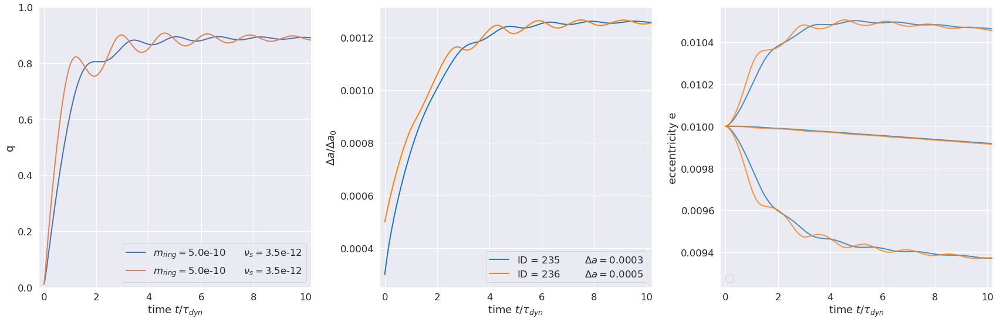

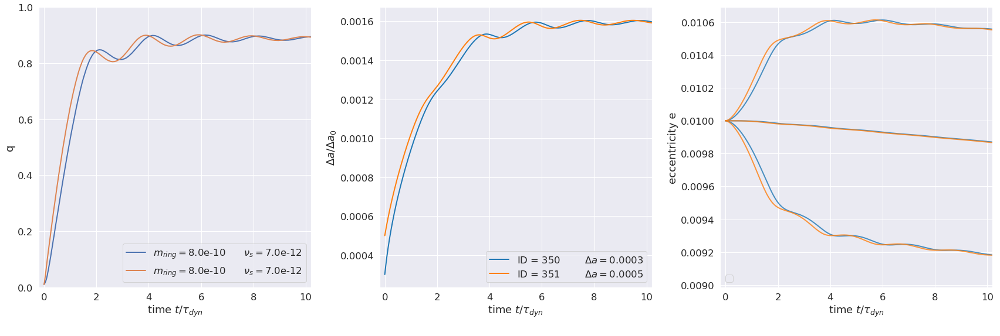

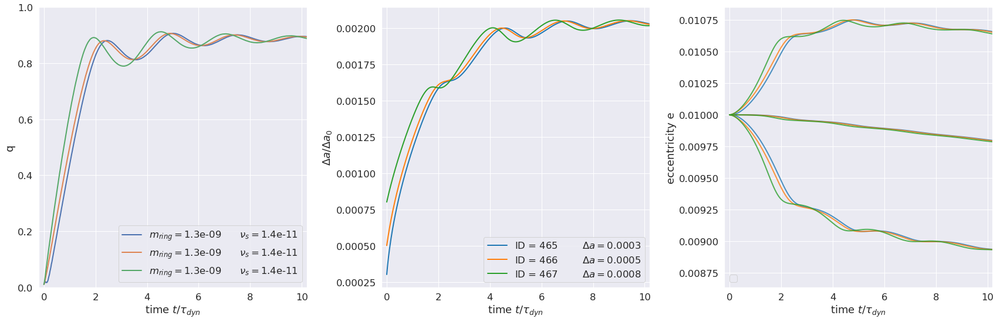

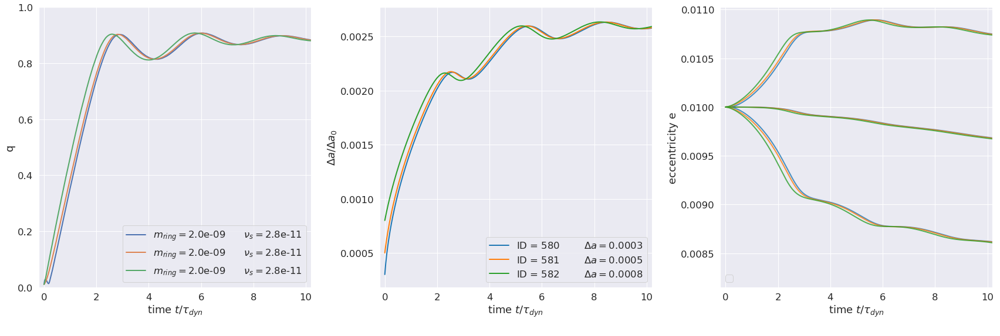

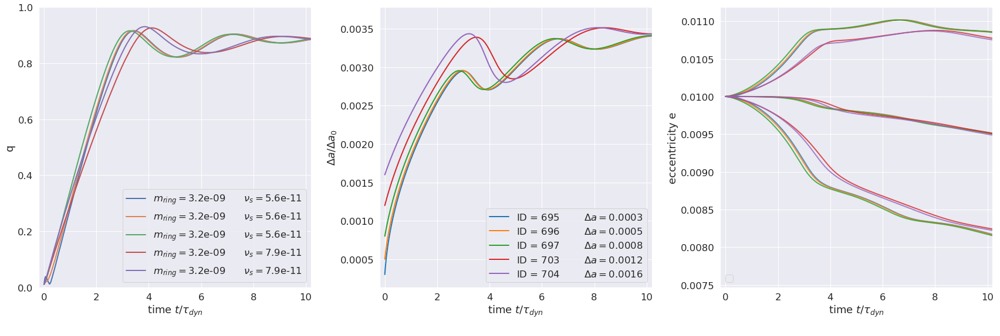

In [11]:
# for selected sim_ids showing low librations, plot q(t/t_dyn)
df = df_results
sim_id_groups = [[235, 236,], [350, 351,], [465, 466, 467,], [580, 581, 582, ], [695, 696, 697, 703, 704,]]
xlim = (-0.2, 10.2)
ylim = (0.0, 1.0)
qts = []
for sim_id_group_idx, sim_id_group in enumerate(sim_id_groups):
    sns.set(font_scale=1.5, font='DejaVu Sans')
    fig, axs = plt.subplots(1, 3, figsize=(24, 8))
    for idx, sim_id in enumerate(sim_id_group):
        jdx = (df.sim_id == sim_id)
        dfs = df[jdx]
        path = dfs.path.values[0]
        delta_q = dfs.delta_q.values[0]
        #read simulation input and revised output
        execfile('inputs.py')
        r, t, vr, vt, times, lambda0, monitor = restore_output(path)
        modified_params = monitor['modified_params']
        for key, val in modified_params.iteritems():
            exec(key + '=val')
            d[key] = val
        #compute time in units of ringlet's dynamical timescale
        dynamical_timescale = nominal_dynamical_timescale
        dynamical_timescale *= (total_ring_mass/2.0e-09)**mass_power_law
        dynamical_timescale *= (shear_viscosity/1.0e-11)**viscosity_power_law
        dynamical_timescale *= (radial_width/0.0005)**width_power_law
        times_dynamical = times/dynamical_timescale
        #calculate differences da, de, dwt between outer & inner streamline's periapse
        a, e, wt, M = coords2elem(J2, Rp, r, t, vr, vt)
        a_inner, a_outer, a_mean, da, e_inner, e_outer, e_mean, de, wt_inner, wt_outer, dwt = \
            orbit_deltas(times, r, a, e, wt)
        H, q, e_prime, wt_prime = calculate_Hq(a_mean, e_mean, da, de, dwt)
        #plot q versus time
        ax = axs[0]
        xp = times_dynamical
        yp = q
        sim_id_str = str(sim_id)
        if (len(sim_id_str) < 3): sim_id_str = '  ' + sim_id_str + '  '
        label = r'$m_{ring}=$' + '{:.1e}'.format(total_ring_mass)
        label += '\t' + r'$\nu_s=$' + '{:.1e}'.format(shear_viscosity)
        p = ax.plot(xp, yp, linestyle='-', linewidth=2, label=label)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel('q')
        p = ax.set_xlim(xlim)
        p = ax.set_ylim(ylim)
        p = ax.legend(loc='lower right')
        #plot da versus time
        ax = axs[1]
        xp = times_dynamical
        yp = da#/radial_width
        label = 'ID = ' + sim_id_str
        label += '\t' + r'$\Delta a =$' + str(radial_width)
        color = color_seq[idx]
        p = ax.plot(xp, yp, linestyle='-', linewidth=2, color=color, label=label)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel(r'$\Delta a/\Delta a_0$')
        p = ax.set_xlim(xlim)
        p = ax.legend(loc='lower right')
        #plot streamline's e-evolution
        ax = axs[2]
        xp = times_dynamical
        yp = e_outer
        color = color_seq[idx]
        p = ax.plot(xp, yp, linestyle='-', linewidth=2, alpha=0.8, color=color)
        if (idx == 0):
            xy = (xp[-1] + 0.21, yp[-1])
            p = ax.annotate('outer', xy=xy)
        yp = e_mean
        p = ax.plot(xp, yp, linestyle='-', linewidth=2, alpha=0.8, color=color)
        if (idx == 0):
            xy = (xp[-1] + 0.21, yp[-1])
            p = ax.annotate('mean', xy=xy)
        yp = e_inner
        p = ax.plot(xp, yp, linestyle='-', linewidth=2, alpha=0.8, color=color)
        if (idx == 0):
            xy = (xp[-1] + 0.21, yp[-1])
            p = ax.annotate('inner', xy=xy)
        p = ax.set_ylabel('eccentricity e')
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_xlim(xlim)
        p = ax.legend(loc='lower left')
        p = plt.tight_layout()
    file = 'figs/low_libration_sims_'+ str(sim_id_group_idx) + '.pdf'
    plt.savefig(file, bbox_inches='tight')

In [12]:
sim_ids = []
sim_ids += [115, 225, 340, 455, 570, 685,]
sim_ids += [341, 456, 571, 686,]
sim_ids += [572, 687,]
sim_ids += [693,]
sim_ids += [699,]

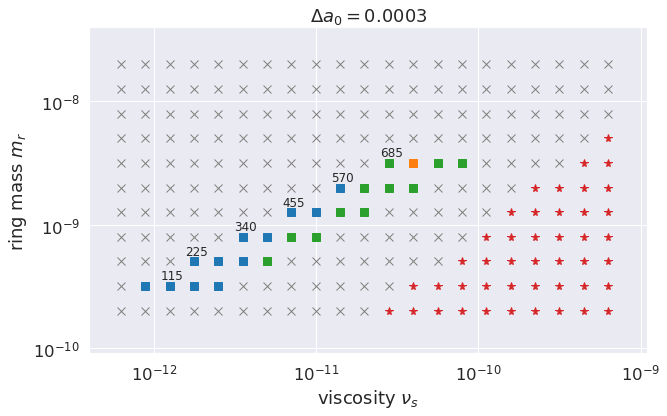

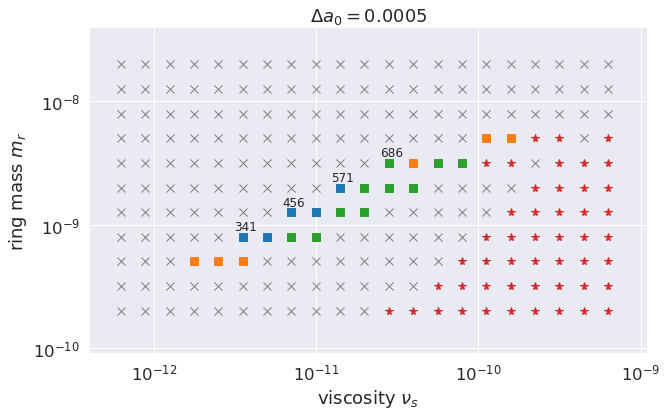

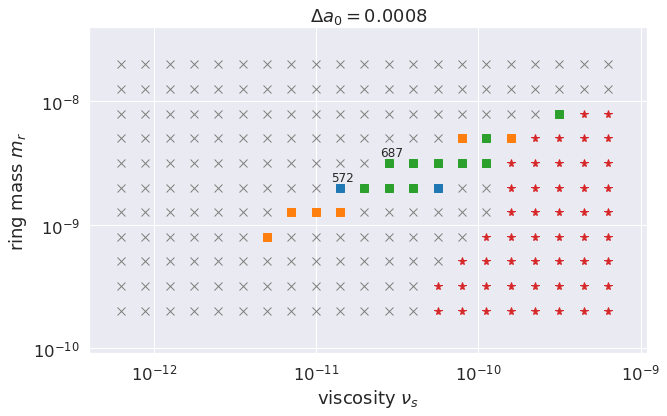

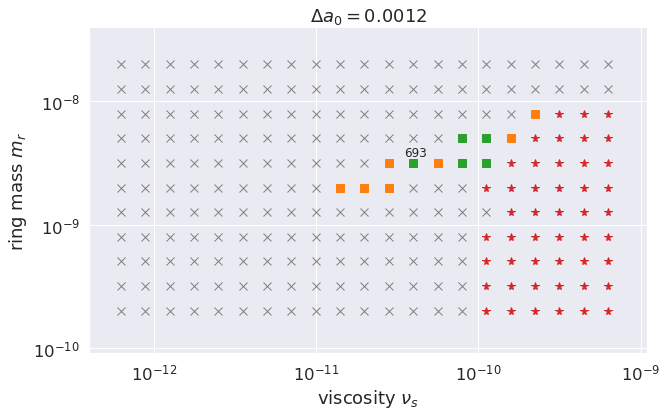

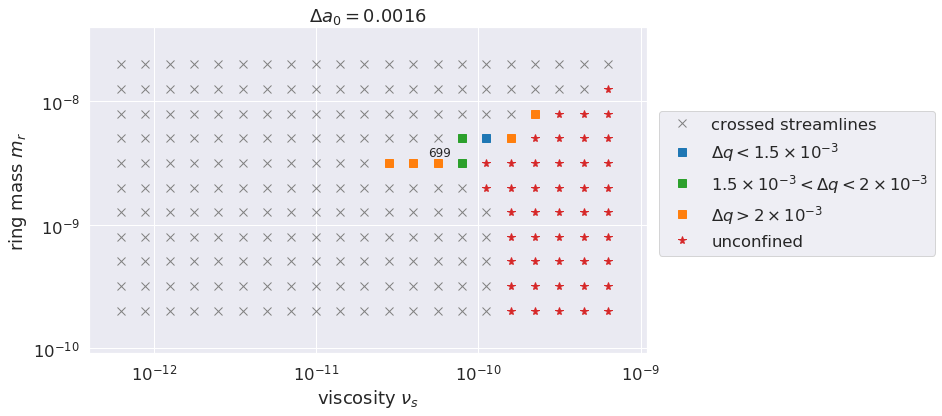

In [13]:
#show grid of simulation outcomes
df = df_results
delta_qs = [(-1, 1.5e-3, r'$\Delta q<1.5\times10^{-3}$', color_seq[0]), 
            (1.5e-3, 2.0e-3, r'$1.5\times10^{-3}<\Delta q<2\times10^{-3}$', color_seq[2]), 
            (2.0e-3, 11, r'$\Delta q> 2\times10^{-3}$', color_seq[1])]
radial_widths = df.radial_width.unique()
for radial_width in radial_widths:
    idx = (df.radial_width == radial_width)
    dfs = df[idx]
    sns.set(font_scale=1.5, font='DejaVu Sans')
    f, ax = plt.subplots(figsize=(10, 6))
    #indicate sims that didnt complete
    idx = (dfs.outcome == 'crossed streamlines')
    dfss = dfs[idx]
    xp = dfss.shear_viscosity
    yp = dfss.total_ring_mass
    p = ax.plot(xp, yp, linestyle='none', marker='x', markersize=8, color='grey', label='crossed streamlines')
    #self confining sims
    idx = (dfs.outcome == 'self-confining')
    dfss = dfs[idx]
    for delta_q_min, delta_q_max, label, color in delta_qs:
        idx = ((dfss.delta_q > delta_q_min) & (dfss.delta_q <= delta_q_max))
        dfsss = dfss[idx]
        xp = dfsss.shear_viscosity
        yp = dfsss.total_ring_mass
        p = ax.plot(xp, yp, linestyle='none', marker='s', markersize=8, label=label, color=color)
    #sims that complete but dont self-confine
    idx = (dfs.outcome == 'unconfined')
    dfss = dfs[idx]
    xp = dfss.shear_viscosity
    yp = dfss.total_ring_mass
    color = color_seq[3]
    p = ax.plot(xp, yp, linestyle='none', marker='*', markersize=8, color=color, label='unconfined')
    #label sims appearing in above plot
    for sim_id in sim_ids:
        idx = (dfs.sim_id == sim_id)
        dfss = dfs[idx]
        try:
            xp = dfss.shear_viscosity.values[0]
            yp = dfss.total_ring_mass.values[0]
            xy = (0.88*xp, 1.13*yp)
            p = ax.annotate(sim_id, xy, fontsize=12)
        except:
            pass
    p = ax.set_xscale('log')
    p = ax.set_yscale('log')
    p = ax.set_xlabel(r'viscosity $\nu_s$')
    p = ax.set_ylabel(r'ring mass $m_r$')
    title = r'$\Delta a_0 = $' + str(radial_width)
    p = ax.set_title(title)
    p = ax.set_ylim(9.0e-11, 4.0e-8)
    p = ax.set_xlim(4.0e-13, 1.1e-9)
    if (radial_width == 0.0016):
        p = ax.legend(loc=(1.02, 0.3))
    file = 'figs/sim_grid_da_'+ str(radial_width).replace('.', 'p') + '.pdf'
    plt.savefig(file, bbox_inches='tight')

In [14]:
#show range of sim parameters
df = df_results
print 'total_ring_mass = ', df.total_ring_mass.unique()
print 'radial_width = ', df.radial_width.unique()
print 'shear_viscosity = ', df.shear_viscosity.unique()

total_ring_mass =  [2.00000000e-10 3.16978638e-10 5.02377286e-10 7.96214341e-10
 1.26191469e-09 2.00000000e-09 3.16978638e-09 5.02377286e-09
 7.96214341e-09 1.26191469e-08 2.00000000e-08]
radial_width =  [0.0003 0.0005 0.0008 0.0012 0.0016]
shear_viscosity =  [6.28000000e-13 8.87073578e-13 1.25302473e-12 1.76994448e-12
 2.50011303e-12 3.53150352e-12 4.98838131e-12 7.04627589e-12
 9.95312925e-12 1.40591688e-11 1.98591037e-11 2.80517296e-11
 3.96241212e-11 5.59705589e-11 7.90605159e-11 1.11675947e-10
 1.57746468e-10 2.22822808e-10 3.14745583e-10 4.44589953e-10
 6.28000000e-10]


In [ ]:
#generate grid of summary plots, for each sim that is unconfined
df = df_results
xlim = (-0.2, 10.2)
radial_widths = df.radial_width.unique()
for radial_width in radial_widths:
    idx = (df.radial_width == radial_width) & (df.outcome == 'unconfined')
    dfs = df[idx].sort_values(['total_ring_mass', 'shear_viscosity'])
    for idx, row in dfs.iterrows():
        #read simulation input and revised output
        execfile('inputs.py')
        path = row.path
        r, t, vr, vt, times, lambda0, monitor = restore_output(path)
        viscous_timescale = (row.radial_width**2)/(12*np.abs(row.shear_viscosity))
        times_viscous = times/viscous_timescale
        #calculate differences da, de, dwt between outer & inner streamline's periapse
        a, e, wt, M = coords2elem(J2, Rp, r, t, vr, vt)
        a_inner, a_outer, a_mean, da, e_inner, e_outer, e_mean, de, wt_inner, wt_outer, dwt = \
            orbit_deltas(times, r, a, e, wt)
        da_init = da[0]
        H, q, e_prime, wt_prime = calculate_Hq(a_mean, e_mean, da, de, dwt)
        #create grid of plots
        sns.set(font_scale=1.45, font='DejaVu Sans')
        fig, axs = plt.subplots(1, 3, figsize=(24, 6))
        #plot streamline's mutual a-evolution
        ax = axs[0]
        x = times_viscous
        y = da/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, label=r'$\Delta a/\Delta a_0$')
        y = (a_outer - a_mean)/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, label='outer')
        y = (a_mean - a_mean)/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, label='mean')
        y = (a_inner - a_mean)/da_init
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=1, label='inner')
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel('(a - a$_{mean})/\Delta a_0$')
        sim_id = row.sim_id
        total_ring_mass = row.total_ring_mass
        title = 'sim_id=' + str(sim_id) + '    total_ring_mass=' + '{:.1e}'.format(total_ring_mass)
        p = ax.set_title(title)
        p = ax.legend()
        p = plt.tight_layout()
        #plot streamline's e-evolution
        ax = axs[1]
        x = times_viscous
        y = e_outer
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=0.8, label='outer')
        y = e_mean
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=0.8, label='mean')
        y = e_inner
        p = ax.plot(x, y, linestyle='-', linewidth=2, alpha=0.8, label='inner')
        p = ax.set_ylabel('eccentricity e')
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        radial_width = row.radial_width
        title = 'radial_width=' + str(radial_width)
        p = ax.set_title(title)
        p = ax.legend()
        p = plt.tight_layout()
        #plot e_prime wt_prime and q versus time
        ax = axs[2]
        x = times_viscous
        y = wt_prime
        p = ax.plot(x, y, linestyle='-', linewidth=1, label=r"$\tilde{\omega}'$")
        y = e_prime
        p = ax.plot(x, y, linestyle='-', linewidth=1, label="e'")
        y = q
        p = ax.plot(x, y, linestyle='-', linewidth=2, label=r'$q$')
        p = ax.plot(x[-1], y[-1], marker='o', markersize=10, label='')
        p = ax.plot(x, x*0 + np.sqrt(3.0)/2.0, linestyle='dashed', linewidth=2, label=r"$\sqrt{3}/2$")
        shear_viscosity = row.shear_viscosity
        title = 'viscosity=' + '{:.1e}'.format(shear_viscosity)
        dq_dt = row.dq_dt
        title += r'      $dq/d\tau_{dyn}$' + '{:.1e}'.format(dq_dt)
        p = ax.set_title(title)
        p = ax.set_xlabel(r'time $t/\tau_{dyn}$')
        p = ax.set_ylabel(r"$e'$")
        p = ax.legend()
        p = plt.tight_layout()